In [1]:
import data
import torch
from torch.utils.data import DataLoader, random_split

/Users/PhilippSchmidt/miniforge3/envs/cvlab2023/lib/python3.9/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: dlopen(/Users/PhilippSchmidt/miniforge3/envs/cvlab2023/lib/python3.9/site-packages/torchvision/image.so, 0x0006): Library not loaded: @rpath/libjpeg.8.dylib
  Referenced from: <A9A8F989-731E-38CF-AD19-47727B1A070E> /Users/PhilippSchmidt/miniforge3/envs/cvlab2023/lib/python3.9/site-packages/torchvision/image.so
  Reason: tried: '/Users/PhilippSchmidt/miniforge3/envs/cvlab2023/lib/python3.9/site-packages/torchvision/../../../libjpeg.8.dylib' (no such file), '/Users/PhilippSchmidt/miniforge3/envs/cvlab2023/lib/python3.9/site-packages/torchvision/../../../libjpeg.8.dylib' (no such file), '/Users/PhilippSchmidt/miniforge3/envs/cvlab2023/lib/python3.9/lib-dynload/../../libjpeg.8.dylib' (no such file), '/Users/PhilippSchmidt/miniforge3/envs/cvlab2023/bin/../lib/libjpeg.8.dylib' (no such file), '/usr/local/lib/libjpeg.8.dylib' (no such file

In [2]:
G_SCENARIO = 1 
G_DATSET_MAX_SIZE = 10 # for speed we reduce the dataset size, enter None for all data.

# use small test set in the beginning to validate that the code is working.
G_TRAIN_SET_RATIO = 0.8 
G_TEST_SET_RATIO = 1-G_TRAIN_SET_RATIO
assert (G_TEST_SET_RATIO + G_TRAIN_SET_RATIO) <= 1.0, 'Test and Train set split invalid'

# choose data sets to include in processing
G_DATASETS = {1: True,
              2: True,
              3: False}

# choose data set locations
G_DATASETS_LOCATION = {1: "../dataset/Part1",
                       2: "../dataset/Part2",
                       3: "../dataset/Part3"}

G_DATASET_LOCATION = [G_DATASETS_LOCATION[dataset_id] for dataset_id, include_dataset in G_DATASETS.items() if include_dataset]
#####################################
# Training settings
G_BATCH_SIZE = 128
G_LEARNING_RATE = 0.001

In [3]:
dataset = data.AOSDataset(G_DATASET_LOCATION,
                          relative_path=True,
                          maximum_datasize=G_DATSET_MAX_SIZE)

In [4]:
dataloader = DataLoader(dataset, batch_size=2, shuffle=True)

In [5]:
feature, label = next(iter(dataloader))
print(feature.shape)
print(label.shape)

torch.Size([2, 11, 512, 512])
torch.Size([2, 1, 512, 512])


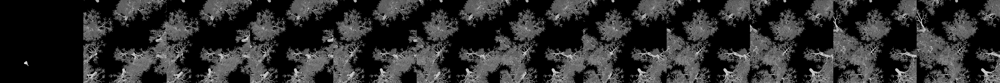

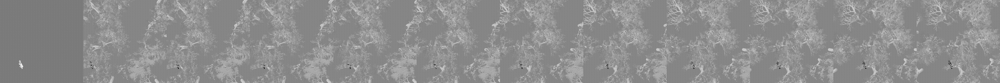

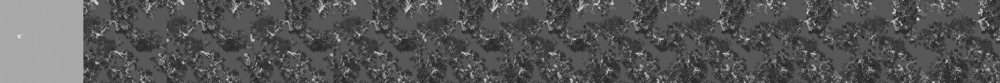

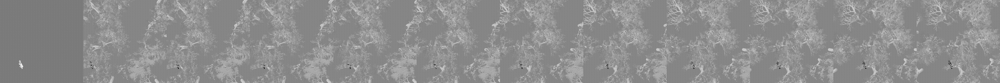

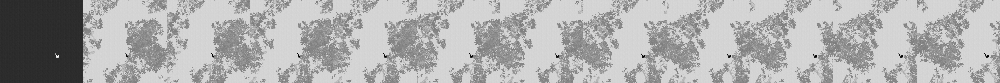

In [6]:
data.plot_dataset(dataset, N_images=5)

In [7]:
train_loader, test_loader = data.AOSDataloader(dataset, train_ratio=0.9)

In [9]:
train_loader, test_loader = data.get_aos_loaders(train_ratio=0.9, train_batch_size = 32, test_batch_size = 32)